# **Bima Bayu Saputra** || **Kompi 17** || **SC61720**

# **Import Library**

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import warnings
from sklearn.preprocessing import LabelEncoder
from scipy.stats import skew, norm
from scipy.stats.mstats import winsorize

In [2]:
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

# **Data Preparation**

## **Load Dataset**

In [3]:
filepath1 = 'https://raw.githubusercontent.com/BimaBayuUWUUU/DSAI_Batch6_Code/main/Dataset/train.csv'

In [4]:
df1 = pd.read_csv(filepath1)

In [5]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [6]:
df1.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


### **Konversi tipe data**

Karena beberapa kolom merupakan kolom `nominal` dan `ordinal` dengan tipe data `numerik` maka diperlukan konversi tipe data tersebut ke dalam tipe data `category`. Selain itu perlu dirubah juga kolom `objec`t menjadi tipe data `category`. Hal ini berdasarkan informasi yang didapat dari deskripsi data yang terlampir pada datset bahwa semua kolom dengan tipe data object adalah data yang memiliki kategori.

In [7]:
df_fix = df1.copy()
df_fix[['MSSubClass', 'OverallQual', 'OverallCond']] = df1[['MSSubClass', 'OverallQual', 'OverallCond']].astype('category')

In [8]:
for col in df_fix.select_dtypes(include=['object']):
    df_fix[col] = df_fix[col].astype('category')

In [9]:
df_fix.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Id             1460 non-null   int64   
 1   MSSubClass     1460 non-null   category
 2   MSZoning       1460 non-null   category
 3   LotFrontage    1201 non-null   float64 
 4   LotArea        1460 non-null   int64   
 5   Street         1460 non-null   category
 6   Alley          91 non-null     category
 7   LotShape       1460 non-null   category
 8   LandContour    1460 non-null   category
 9   Utilities      1460 non-null   category
 10  LotConfig      1460 non-null   category
 11  LandSlope      1460 non-null   category
 12  Neighborhood   1460 non-null   category
 13  Condition1     1460 non-null   category
 14  Condition2     1460 non-null   category
 15  BldgType       1460 non-null   category
 16  HouseStyle     1460 non-null   category
 17  OverallQual    1460 non-null   ca

## **Mencari missing value dan mengatasi missing value jika ada.**

### **Menemukan Missing Value**

In [10]:
def display_null_columns(df):
    null_values = df.isnull()

    null_count = null_values.sum()
    
    null_columns = null_count[null_count > 0]

    if not null_columns.empty:
        print("Kolom yang memiliki nilai null, jumlah null, dan tipe data kolomnya:")
        null_info = pd.concat([null_columns, df[null_columns.index].dtypes], axis=1)
        null_info.columns = ['Jumlah Null', 'Tipe Data']
        print(null_info)
    else:
        print("Tidak ada nilai null dalam DataFrame.")

In [11]:
display_null_columns(df_fix)

Kolom yang memiliki nilai null, jumlah null, dan tipe data kolomnya:
              Jumlah Null Tipe Data
LotFrontage           259   float64
Alley                1369  category
MasVnrType            872  category
MasVnrArea              8   float64
BsmtQual               37  category
BsmtCond               37  category
BsmtExposure           38  category
BsmtFinType1           37  category
BsmtFinType2           38  category
Electrical              1  category
FireplaceQu           690  category
GarageType             81  category
GarageYrBlt            81   float64
GarageFinish           81  category
GarageQual             81  category
GarageCond             81  category
PoolQC               1453  category
Fence                1179  category
MiscFeature          1406  category


### **Memperbaiki Mising Value pada data Ketegorik**

#### Data yang memang memiliki kelas **None** atau **NA**.

1. Alley
2. MasVnrType
3. BsmtQual
4. BsmtCond
5. BsmtExposure
6. BsmtFinType1
7. BsmtFinType2
8. FireplaceQu
9. GarageType
10. GarageFinish
11. GarageQual
12. GarageCond
13. PoolQC
14. Fence
15. MiscFeature

#### Data yang tidak memiliki kelas **None** atau **NA**.


1. MSZoning
2. Utilities
3. Exterior1st
4. Exterior2nd
5. Electrical
6. KitchenQual
7. Functional
8. SaleType

#### Mengubah nilai **None** atau **NA** menjadi **Without**.

Hal ini dilakukan karena sesuai deksripsi data memang ada kolom kategori dengan kelas **None** atau **NA** yang berarti tidak memiliki fasilitas tersebut.

In [12]:
def replace_nan_with_without(df, columns):
    df_copy = df.copy()
    for col in columns:
        if 'Without' not in df_copy[col].cat.categories:
            df_copy[col] = df_copy[col].cat.add_categories('Without')
        df_copy[col] = df_copy[col].fillna('Without')
    return df_copy

In [13]:
columns_to_update = [
    'Alley', 'MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
    'BsmtFinType1', 'BsmtFinType2', 'FireplaceQu', 'GarageType',
    'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence',
    'MiscFeature'
]

df_modified = replace_nan_with_without(df_fix, columns_to_update)

In [14]:
display_null_columns(df_modified)

Kolom yang memiliki nilai null, jumlah null, dan tipe data kolomnya:
             Jumlah Null Tipe Data
LotFrontage          259   float64
MasVnrArea             8   float64
Electrical             1  category
GarageYrBlt           81   float64


#### Memperbaiki Missing Value pada data String tanpa kategorikal **NA/None** menggunkana **modus**

In [15]:
def fill_na_with_mode(df, columns_to_fill):
    
    df_copy = df.copy()
    for col in columns_to_fill:
        mode_value = df_copy[col].mode()[0] 
        df_copy[col] = df_copy[col].fillna(mode_value)
        
    return df_copy

In [16]:
columns_to_fill = ['Electrical']

df_filled = fill_na_with_mode(df_modified, columns_to_fill)

In [17]:
display_null_columns(df_filled)

Kolom yang memiliki nilai null, jumlah null, dan tipe data kolomnya:
             Jumlah Null Tipe Data
LotFrontage          259   float64
MasVnrArea             8   float64
GarageYrBlt           81   float64


### **Memperbaiki Mising Value pada data Numerik**

#### Mengisi menggunakan **mean**. 

In [18]:
def fill_null_with_mean(df, columns_with_null):
    df_copy = df.copy()
    for col in columns_with_null:
        df_copy[col] = df_copy[col].fillna(df[col].median())
        
    return df_copy

In [19]:

columns_with_null = ['LotFrontage', 'MasVnrArea', 'GarageYrBlt']
df_missing_fixed = fill_null_with_mean(df_filled, columns_with_null)

In [20]:
display_null_columns(df_missing_fixed)

Tidak ada nilai null dalam DataFrame.


In [21]:
df_missing_fixed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Id             1460 non-null   int64   
 1   MSSubClass     1460 non-null   category
 2   MSZoning       1460 non-null   category
 3   LotFrontage    1460 non-null   float64 
 4   LotArea        1460 non-null   int64   
 5   Street         1460 non-null   category
 6   Alley          1460 non-null   category
 7   LotShape       1460 non-null   category
 8   LandContour    1460 non-null   category
 9   Utilities      1460 non-null   category
 10  LotConfig      1460 non-null   category
 11  LandSlope      1460 non-null   category
 12  Neighborhood   1460 non-null   category
 13  Condition1     1460 non-null   category
 14  Condition2     1460 non-null   category
 15  BldgType       1460 non-null   category
 16  HouseStyle     1460 non-null   category
 17  OverallQual    1460 non-null   ca

## **Mencari duplicate value dan menyelesaikan duplicate value jika ada.**

### **Menemukan duplicate value**

In [22]:
def check_duplicate_ids(df):
    duplicate_all= df.duplicated()
    
    duplicate_rows = df[duplicate_all]
    
    if not duplicate_rows.empty:
        print("Ada Data yang duplikat:")
        print(duplicate_rows)
    else:
        print("Tidak ada Data duplikat dalam DataFrame.")

In [23]:
check_duplicate_ids(df_missing_fixed)

Tidak ada Data duplikat dalam DataFrame.


In [24]:
df_fix_duplicate = df_missing_fixed.copy().drop_duplicates()

Duplikasi data tidak ditemukan dalam dataset. Maka tidak perlu dilakukan tindakan apapun.

## **Menentukan Tujuan Preparation Dataset dan Target Column**

Dalam dataset ini, tujuan dari persiapan data adalah untuk mempersiapkan data yang akan digunakan untuk melakukan analisis data dan pemodelan regresi. Target column yang akan digunakan adalah `SalePrice`.

In [25]:
target_columns = ['SalePrice']

## **Memeriksa outlier dan menangani outlier jika ada.**

### **Menemukan Outlier**

#### Boxplot

In [26]:
def plot_boxplot(df, target_columns, figsize=(12, 8)):
    num_plots = len(target_columns)
    num_cols = 4 

    num_rows = num_plots // num_cols
    if num_plots % num_cols:
        num_rows += 1

    fig, axes = plt.subplots(num_rows, num_cols, figsize=figsize)

    for i, column in enumerate(target_columns):
        row = i // num_cols
        col = i % num_cols
        ax = axes[row, col] if num_rows > 1 else axes[col]

        sns.boxplot(y=df[column], ax=ax)
        ax.set_title(f'Boxplot {column}')

    for i in range(num_plots, num_rows * num_cols):
        fig.delaxes(axes.flatten()[i])

    plt.tight_layout()
    plt.show()

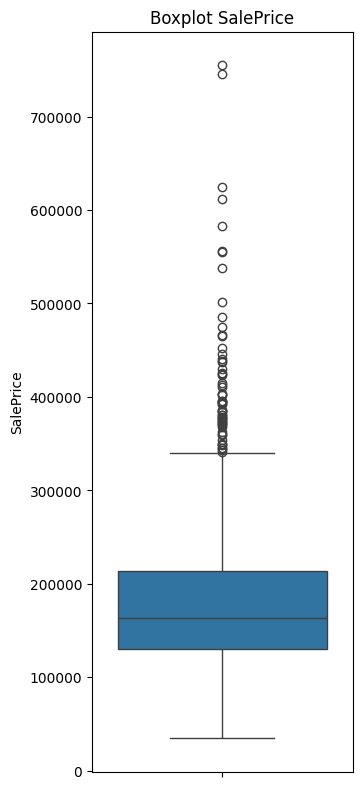

In [27]:
plot_boxplot(df_fix_duplicate, target_columns)

#### Check Outlier pada Kolom Target

In [28]:
Q1 = df_missing_fixed['SalePrice'].quantile(0.25)
Q3 = df_missing_fixed['SalePrice'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = df_missing_fixed[(df_fix_duplicate['SalePrice'] < lower_bound) | (df_fix_duplicate['SalePrice'] > upper_bound)]
print("Data Outlier:")
outliers

Data Outlier:


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
11,12,60,RL,85.0,11924,Pave,Without,IR1,Lvl,AllPub,...,0,Without,Without,Without,0,7,2006,New,Partial,345000
53,54,20,RL,68.0,50271,Pave,Without,IR1,Low,AllPub,...,0,Without,Without,Without,0,11,2006,WD,Normal,385000
58,59,60,RL,66.0,13682,Pave,Without,IR2,HLS,AllPub,...,0,Without,Without,Without,0,10,2006,New,Partial,438780
112,113,60,RL,77.0,9965,Pave,Without,Reg,Lvl,AllPub,...,0,Without,Without,Without,0,10,2007,New,Partial,383970
151,152,20,RL,107.0,13891,Pave,Without,Reg,Lvl,AllPub,...,0,Without,Without,Without,0,1,2008,New,Partial,372402
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1268,1269,50,RL,69.0,14100,Pave,Without,IR1,Lvl,AllPub,...,0,Without,GdWo,Without,0,5,2008,WD,Normal,381000
1353,1354,50,RL,56.0,14720,Pave,Without,IR1,Lvl,AllPub,...,0,Without,Without,Without,0,3,2010,WD,Normal,410000
1373,1374,20,RL,69.0,11400,Pave,Without,Reg,Lvl,AllPub,...,0,Without,Without,Without,0,3,2007,WD,Normal,466500
1388,1389,20,RL,42.0,14892,Pave,Without,IR1,HLS,AllPub,...,0,Without,Without,Without,0,10,2009,WD,Normal,377500


In [29]:
lower_bound

3937.5

In [30]:
upper_bound

340037.5

### **Mengatasi Outlier**

#### Mengatasi Outliers dengan Winsorization

Secara singkatnya methode ini akan mengganti nilai outlier dengan nilai maksimum atau minimum yang telah ditentukan.

In [31]:
def transform_outliersW(df, numeric_columns):
    df_copy = df.copy()
    
    for column in numeric_columns:
        q1 = df_copy[column].quantile(0.25)
        q3 = df_copy[column].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        
        if (df_copy[column] < lower_bound).any() or (df_copy[column] > upper_bound).any():
            values = df_copy[column].values
            winsorized_data = winsorize(values, limits=[0.05, 0.05])
            df_copy[column] = winsorized_data
        
    return df_copy

In [32]:
df_otcW = transform_outliersW(df_fix_duplicate, target_columns)

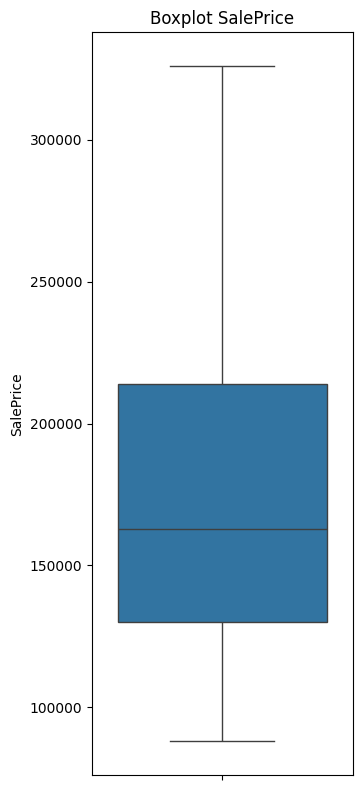

In [33]:
plot_boxplot(df_otcW, target_columns)

#### Mengatasi Outliers dengan Capping

Seacar singkatnya methode ini akan mengganti nilai yang berada di luar batas atas dan batas bawah dengan nilai batas atas dan batas bawah tersebut.

In [34]:
def transform_outliersC(df, target_columns):
    df_copy = df.copy()
    
    for column in target_columns:
        q1 = df_copy[column].quantile(0.25)
        q3 = df_copy[column].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        
        df_copy[column] = df_copy[column].clip(lower=lower_bound, upper=upper_bound)
        
    return df_copy


In [35]:
df_otcC = transform_outliersC(df_fix_duplicate, target_columns)

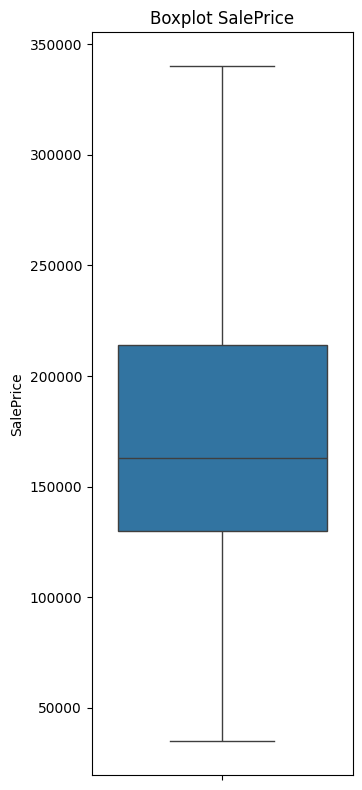

In [36]:
plot_boxplot(df_otcC, target_columns)

#### Hasil yang diambil

Metode Winsorization lebih cocok karena:

1. Efektivitas : Mengatasi outliers tanpa menghapus data sepenuhnya.
2. Mempertahankan Ukuran Sampel: Tidak mengurangi ukuran sampel secara signifikan.
3. Menghindari Bias: Mencegah bias yang mungkin terjadi dengan penghapusan data.
4. Fleksibel: Dapat disesuaikan dengan persentase pemotongan yang berbeda.

## **Memeriksa imbalance data dan menyelesaikan imbalance data jika ada.**

In [37]:
df_imbalance = df_otcW.copy()

### **Mencari Imbalance Data**

#### Histogram

In [38]:
def plot_numeric_columns_histogram_subplots(data, target_columns):
    if isinstance(target_columns, str):
        target_columns = [target_columns] 
        num_plots = 1 
    else:
        num_plots = len(target_columns)

    num_cols = 4
    num_rows = num_plots // num_cols
    if num_plots % num_cols:
        num_rows += 1

    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(36, 8))
    
    if isinstance(axes, np.ndarray):
        axes = axes.flatten()
    else:
        axes = [axes]

    for i, column in enumerate(target_columns):
        ax = axes[i]
        sns.histplot(data[column], kde=True, ax=ax, color='skyblue')
        ax.set_title(f'Histogram of {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Frequency')
        ax.grid(False)
    
    for i in range(num_plots, num_rows * num_cols):
        plt.delaxes(axes[i])
    
    plt.tight_layout()
    plt.show()


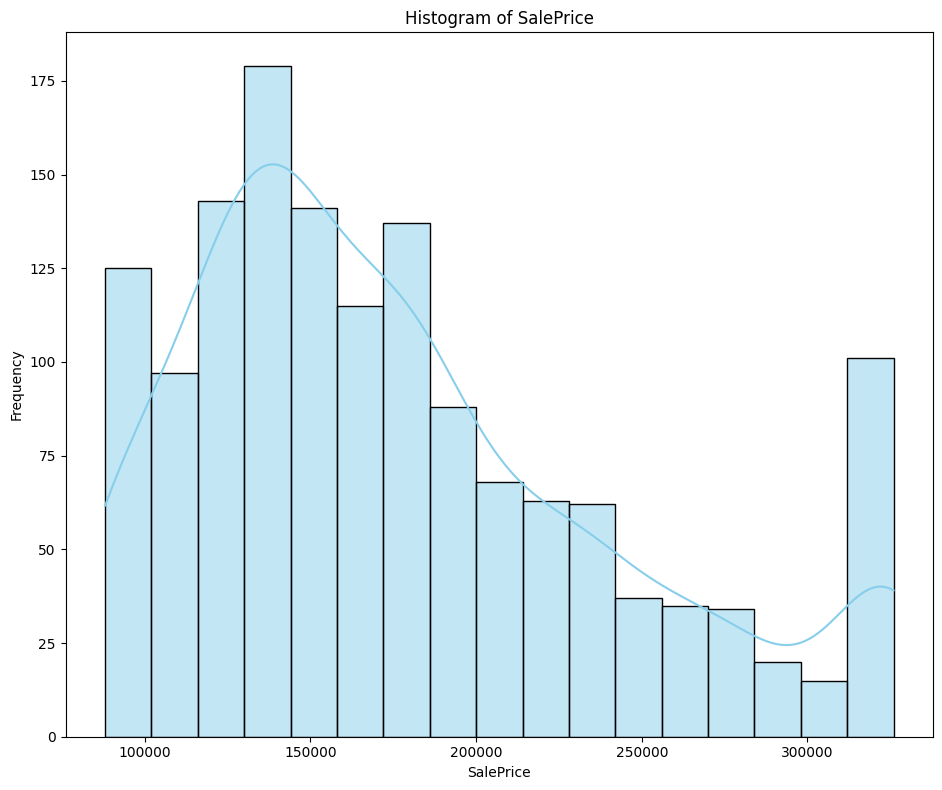

In [39]:
plot_numeric_columns_histogram_subplots(df_imbalance, target_columns)

#### Hitung Rasio Kelas Minoritas:Mayoritas

In [40]:
def calculate_class_imbalance_auto(df, columns, num_bins=10):
    categorical_columns = []
    continuous_columns = []

    for column in columns:
        if pd.api.types.is_categorical_dtype(df[column]) or pd.api.types.is_string_dtype(df[column]):
            categorical_columns.append(column)
        elif pd.api.types.is_numeric_dtype(df[column]):
            continuous_columns.append(column)

    imbalance_data = []

    for column in categorical_columns:
        class_counts = df[column].value_counts()
        minority_class_count = class_counts.min()
        majority_class_count = class_counts.max()
        imbalance_ratio = minority_class_count / majority_class_count
        imbalance_data.append([column, imbalance_ratio])

    for column in continuous_columns:
        bins = np.linspace(df[column].min(), df[column].max(), num_bins+1)
        categories = pd.cut(df[column], bins=bins, include_lowest=True)
        
        class_counts = categories.value_counts()
        
        minority_bin_count = class_counts.min()
        majority_bin_count = class_counts.max()
        imbalance_ratio = minority_bin_count / majority_bin_count

        imbalance_data.append([column, imbalance_ratio])

    imbalance_df = pd.DataFrame(imbalance_data, columns=['Column', 'Imbalance Ratio'])
    return imbalance_df


In [41]:
calculate_class_imbalance_auto(df_otcW, target_columns)

,Column,Imbalance Ratio
0,SalePrice,0.131783


### **Mengatasi Masalah Imbalance Data**

**Tidak diperlukan balancing data karena dataset dipersiapkan untuk model regresi. Sehingga tidak perlu mengatasi imbalance data karena regresi sendiri tidak bergantung pada kelas-kelas dalam fitur.**

## **Membuat class Encoder dan Decoder**

In [42]:
class AutoLabelEncoder:
    def __init__(self):
        self.encoders = {}

    def fit_transform(self, df):
        for column in df.columns:
            if df[column].dtype == 'category':
                encoder = LabelEncoder()
                df[column] = encoder.fit_transform(df[column])
                self.encoders[column] = {label: index for index, label in enumerate(encoder.classes_)}
        return df
    
    def transform(self, df):
        for column, encoder in self.encoders.items():
            if column in df.columns:
                df[column] = df[column].map(encoder).fillna(df[column])
        return df

    def inverse_transform(self, df):
        for column, encoder in self.encoders.items():
            if column in df.columns:
                reverse_encoder = {v: k for k, v in encoder.items()}
                df[column] = df[column].map(reverse_encoder).fillna(df[column])
        return df


In [43]:
auto_encoder = AutoLabelEncoder()
encoded_df = auto_encoder.fit_transform(df_imbalance.copy())

# **Exploratory Data Analysis (EDA)**

## **Load Dataset**

In [44]:
data_eda = df_otcW

## **Mengelaborasi Features dan Tipe Data**

In [45]:
data_eda.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,Without,Reg,Lvl,AllPub,...,0,Without,Without,Without,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,Without,Reg,Lvl,AllPub,...,0,Without,Without,Without,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,Without,IR1,Lvl,AllPub,...,0,Without,Without,Without,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,Without,IR1,Lvl,AllPub,...,0,Without,Without,Without,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,Without,IR1,Lvl,AllPub,...,0,Without,Without,Without,0,12,2008,WD,Normal,250000


In [46]:
data_eda.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,Without,Reg,Lvl,AllPub,...,0,Without,Without,Without,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,Without,Reg,Lvl,AllPub,...,0,Without,MnPrv,Without,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,Without,Reg,Lvl,AllPub,...,0,Without,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,Without,Reg,Lvl,AllPub,...,0,Without,Without,Without,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,Without,Reg,Lvl,AllPub,...,0,Without,Without,Without,0,6,2008,WD,Normal,147500


In [47]:
print("Informasi Dataset:")
data_eda.info()

Informasi Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Id             1460 non-null   int64   
 1   MSSubClass     1460 non-null   category
 2   MSZoning       1460 non-null   category
 3   LotFrontage    1460 non-null   float64 
 4   LotArea        1460 non-null   int64   
 5   Street         1460 non-null   category
 6   Alley          1460 non-null   category
 7   LotShape       1460 non-null   category
 8   LandContour    1460 non-null   category
 9   Utilities      1460 non-null   category
 10  LotConfig      1460 non-null   category
 11  LandSlope      1460 non-null   category
 12  Neighborhood   1460 non-null   category
 13  Condition1     1460 non-null   category
 14  Condition2     1460 non-null   category
 15  BldgType       1460 non-null   category
 16  HouseStyle     1460 non-null   category
 17  OverallQual   

### **Korelasi Features**

In [48]:
# Hitung korelasi Pearson
sales_corr = encoded_df.corr()

In [49]:
sales_corr

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,1.000000,0.018745,-0.006096,-0.009921,-0.033226,0.008916,-0.001530,0.032122,-0.019659,0.013324,...,0.057044,-0.033928,-0.000399,0.037057,-0.006242,0.021172,0.000712,0.019773,-0.005806,-0.027520
MSSubClass,0.018745,1.000000,0.037785,-0.308683,-0.132505,-0.025737,-0.094916,0.090920,-0.007658,-0.026217,...,0.020837,-0.015024,0.074567,0.033339,-0.006062,0.007052,-0.022100,0.020195,-0.033097,-0.054703
MSZoning,-0.006096,0.037785,1.000000,-0.105961,-0.034452,0.087654,-0.052039,0.061887,-0.017854,-0.001192,...,-0.003128,0.002882,-0.061289,0.000673,0.009293,-0.031496,-0.020628,0.097437,0.009494,-0.208875
LotFrontage,-0.009921,-0.308683,-0.105961,1.000000,0.304522,-0.037349,0.132003,-0.138877,-0.076080,-0.001027,...,0.180819,-0.191902,-0.036421,-0.004266,-0.000255,0.010451,0.006380,-0.031412,0.058857,0.333487
LotArea,-0.033226,-0.132505,-0.034452,0.304522,1.000000,-0.197131,0.060105,-0.165315,-0.149083,0.010123,...,0.077672,-0.065167,0.036031,-0.103544,0.038068,0.001205,-0.014261,0.012292,0.034169,0.262878
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MoSold,0.021172,0.007052,-0.031496,0.010451,0.001205,0.003690,0.013094,-0.033455,-0.011599,-0.051552,...,-0.033737,0.036368,-0.009892,-0.014193,-0.006495,1.000000,-0.145721,-0.047386,0.013320,0.069022
YrSold,0.000712,-0.022100,-0.020628,0.006380,-0.014261,-0.025043,0.020944,0.036449,0.020507,0.023353,...,-0.059689,0.060904,-0.035366,-0.055962,0.004906,-0.145721,1.000000,-0.002327,0.003880,-0.028968
SaleType,0.019773,0.020195,0.097437,-0.031412,0.012292,0.014339,0.008205,-0.000911,-0.025754,-0.126770,...,0.011009,-0.013592,-0.006154,-0.003311,0.015773,-0.047386,-0.002327,1.000000,0.184067,-0.044484
SaleCondition,-0.005806,-0.033097,0.009494,0.058857,0.034169,0.006064,0.035717,-0.038118,0.033809,-0.089701,...,-0.067251,0.097425,0.100675,0.003192,0.013027,0.013320,0.003880,0.184067,1.000000,0.227129


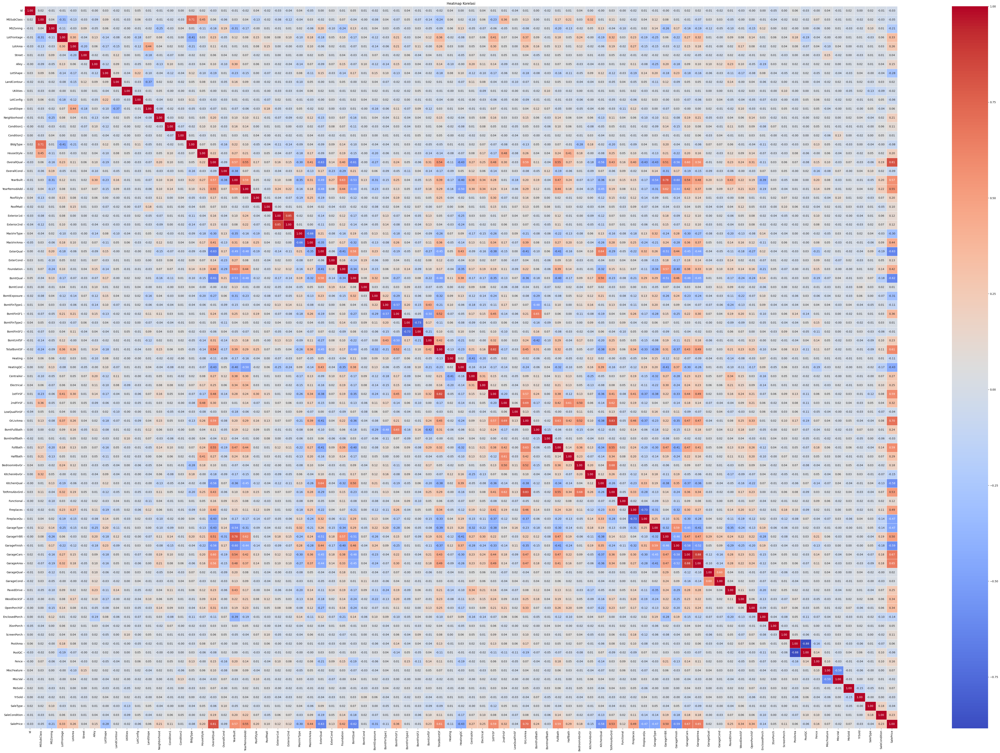

In [50]:
plt.figure(figsize=(72, 48))
sns.heatmap(sales_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Heatmap Korelasi')
plt.show()

In [51]:
high_corr_columns = sales_corr[(sales_corr > 0.7) & (sales_corr < 1)]

for col1 in high_corr_columns.index:
    for col2 in high_corr_columns.index:
        if col1 != col2 and sales_corr.loc[col1, col2] > 0.7:
            print(f"{col1} dan {col2} memiliki korelasi: {sales_corr.loc[col1, col2]}")

MSSubClass dan BldgType memiliki korelasi: 0.7124744102567905
BldgType dan MSSubClass memiliki korelasi: 0.7124744102567905
OverallQual dan SalePrice memiliki korelasi: 0.812369458889186
YearBuilt dan GarageYrBlt memiliki korelasi: 0.7771817647425319
Exterior1st dan Exterior2nd memiliki korelasi: 0.8541629837325787
Exterior2nd dan Exterior1st memiliki korelasi: 0.8541629837325787
TotalBsmtSF dan 1stFlrSF memiliki korelasi: 0.8195299750050339
1stFlrSF dan TotalBsmtSF memiliki korelasi: 0.8195299750050339
GrLivArea dan TotRmsAbvGrd memiliki korelasi: 0.8254893743088425
TotRmsAbvGrd dan GrLivArea memiliki korelasi: 0.8254893743088425
GarageYrBlt dan YearBuilt memiliki korelasi: 0.7771817647425319
GarageCars dan GarageArea memiliki korelasi: 0.882475414281462
GarageArea dan GarageCars memiliki korelasi: 0.882475414281462
SalePrice dan OverallQual memiliki korelasi: 0.812369458889186


### **Univariate Analysis**

#### **Numerical Features**

In [52]:
def plot_numeric_columns_histogram_subplots(data):
    numeric_columns = data.select_dtypes(include='number').columns
    num_plots = len(numeric_columns)
    num_cols = 4
    num_rows = num_plots // num_cols
    if num_plots % num_cols:
        num_rows += 1
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(30, 60))
    
    for i, column in enumerate(numeric_columns):
        row = i // num_cols
        col = i % num_cols
        ax = axes[row, col]
        
        sns.histplot(data[column], kde=True, ax=ax, color='skyblue')
        ax.set_title(f'Histogram of {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Frequency')
        ax.grid(False)
    
    for i in range(num_plots, num_rows * num_cols):
        plt.delaxes(plt.subplot(num_rows, num_cols, i + 1))
    
    plt.show()

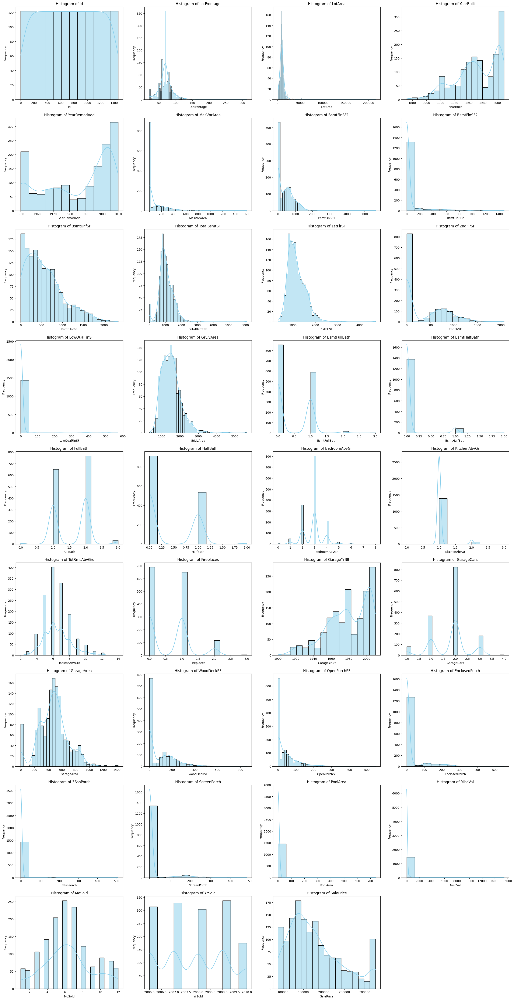

In [53]:
plot_numeric_columns_histogram_subplots(data_eda)

#### **Categorical Features**

In [54]:
def plot_categorical_histograms(df, figsize=(40, 86)): 
    num_cols = 3
    object_columns = df.select_dtypes(include='category').columns
    num_plots = len(object_columns)
    num_rows = num_plots // num_cols
    if num_plots % num_cols:
        num_rows += 1

    fig = plt.figure(figsize=figsize)
    plot_count = 0 
    
    for i, column in enumerate(object_columns):
        if df[column].nunique() > 10:
            figsize_custom = (24, 12)
            plt.figure(figsize=figsize_custom)
            sns.countplot(data=df, x=column, color='skyblue')
            plt.title(f'Count Plot {column}')
            plt.tight_layout()
            continue  
        else:
            plot_count += 1
            ax = fig.add_subplot(num_rows, num_cols, plot_count)
            sns.countplot(data=df, x=column, ax=ax, color='skyblue')
            ax.set_title(f'Count Plot {column}')       
    for i in range(num_plots, num_rows * num_cols):
        plt.delaxes(plt.subplot(num_rows, num_cols, i + 1))
        
    plt.tight_layout()
    plt.show()

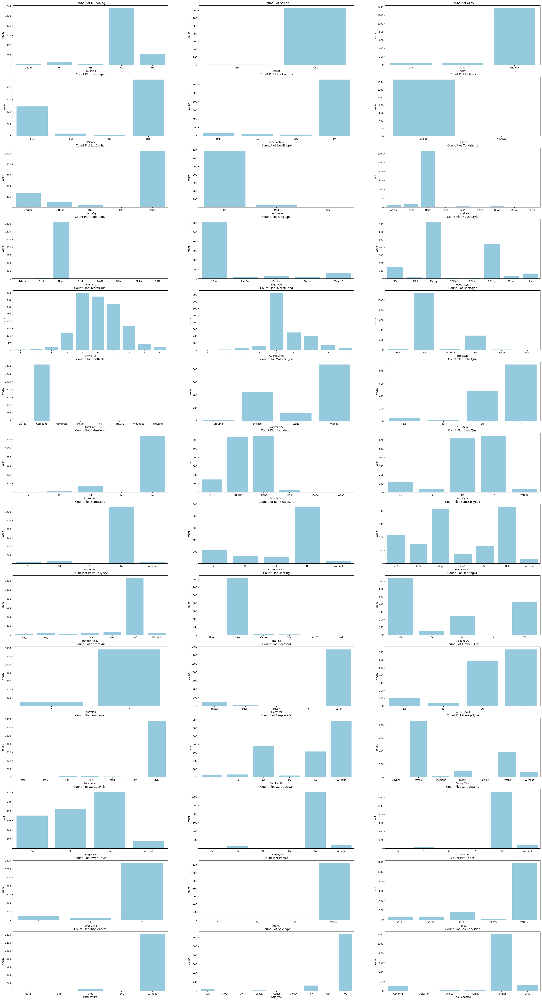

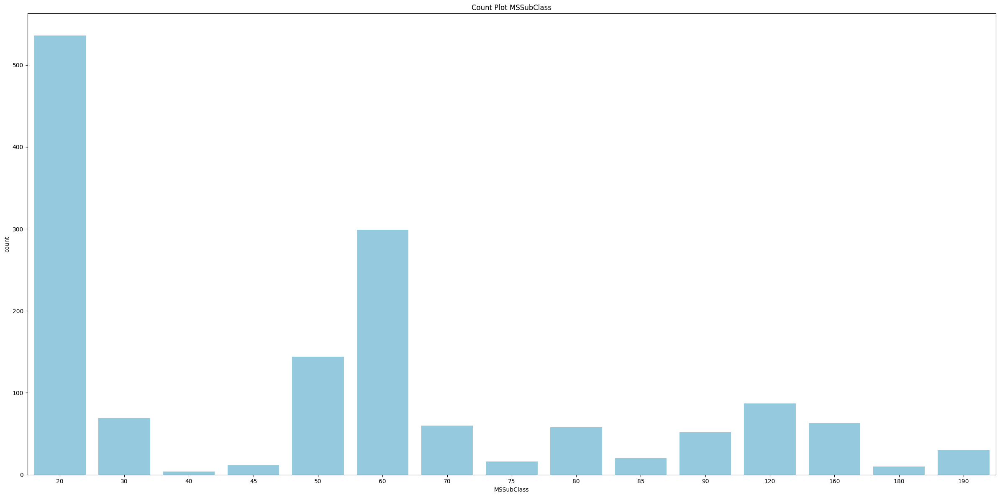

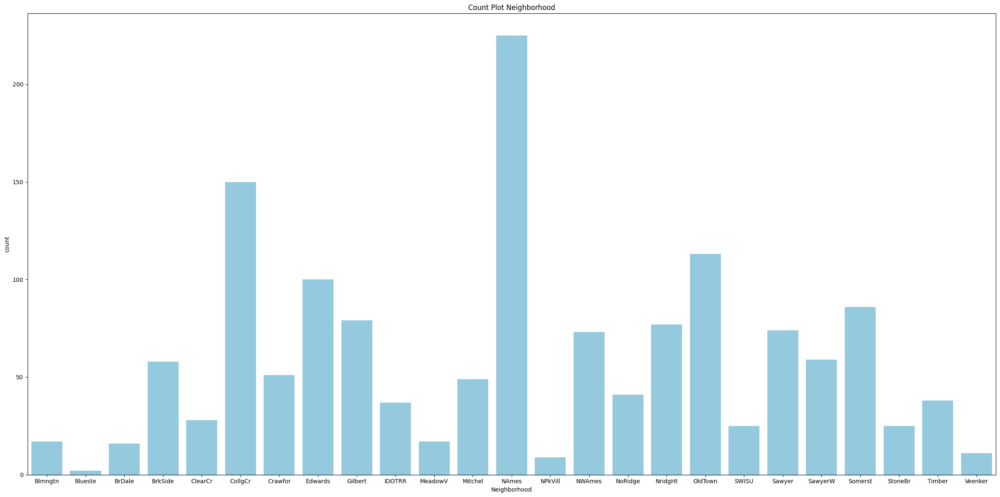

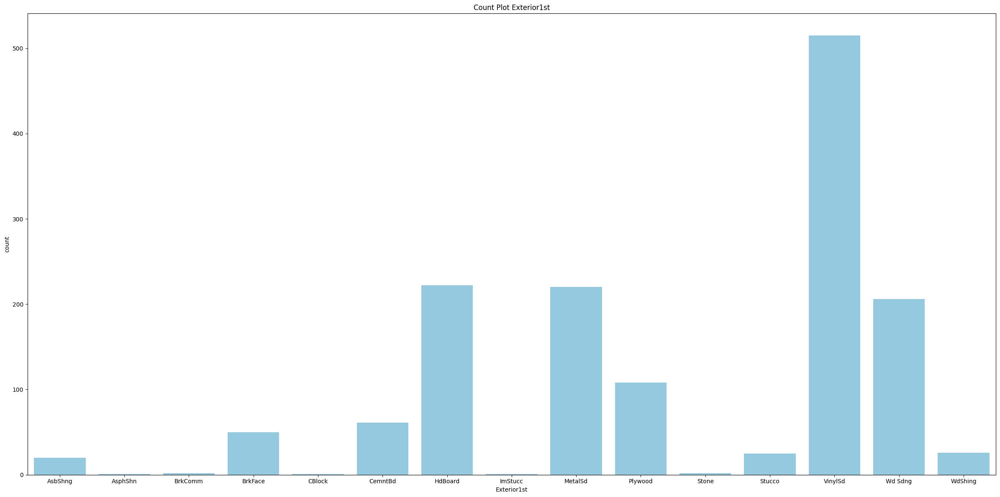

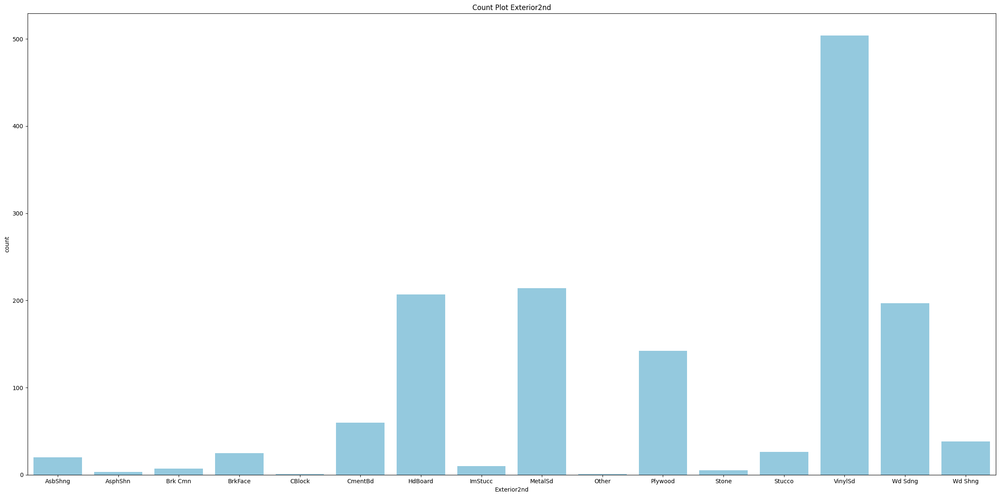

In [55]:
plot_categorical_histograms(data_eda)

### **Bi/Mul Variate Analysis**

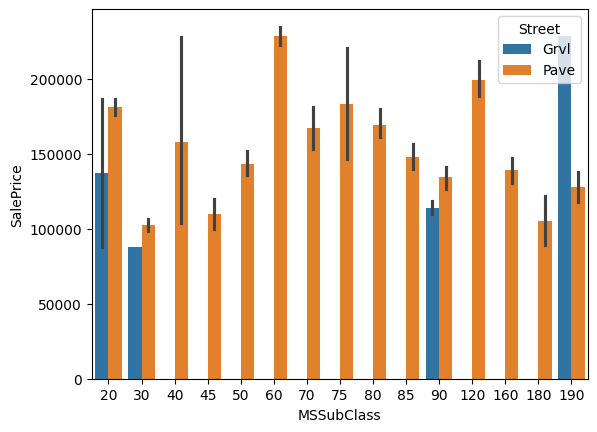

In [56]:
ax = sns.barplot(x="MSSubClass", y="SalePrice", hue="Street", data=data_eda)

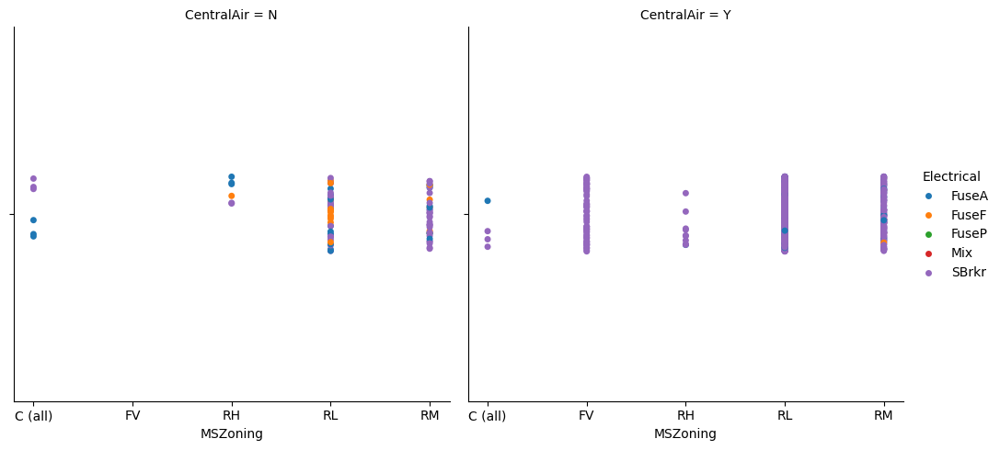

In [57]:
ax = sns.catplot(x='MSZoning', data=data_eda, col='CentralAir', hue='Electrical')

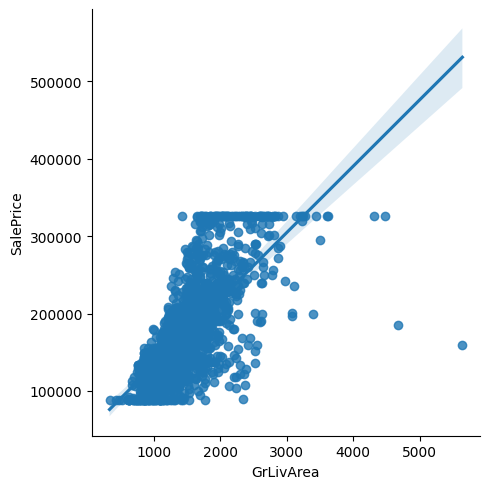

In [58]:
ax = sns.lmplot(x="GrLivArea", y="SalePrice", data=data_eda,)

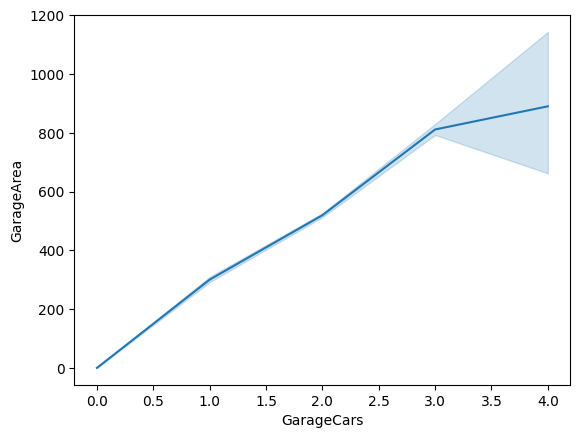

In [59]:
ax = sns.lineplot(x="GarageCars", y="GarageArea", data=data_eda)

## **Mean, Median, dan Modus**

`Mean`, `median`, dan `modus` adalah tiga metrik statistik yang digunakan untuk menggambarkan data secara deskriptif.

- **Mean** adalah jumlah dari semua nilai dalam kumpulan data dibagi dengan total jumlah nilai. `Mean` sering digunakan sebagai ukuran pusat yang paling umum, namun rentan terhadap pengaruh nilai ekstrem atau outlier. Jika ada outlier, mean dapat menjadi tidak representatif. Meskipun demikian, `mean` cocok digunakan untuk data yang terdistribusi normal atau mendekati normal.

- **Median** adalah nilai tengah dalam kumpulan data setelah diurutkan secara berurutan. `Median` tidak dipengaruhi oleh nilai ekstrem atau outlier, sehingga lebih stabil daripada `mean`. Karena itu, `median` lebih disukai untuk data yang memiliki distribusi yang miring (skewed) atau ketika ada nilai ekstrem.

- **Modus** adalah nilai yang paling sering muncul dalam kumpulan data. `Modus` dapat memiliki lebih dari satu nilai (multi-modal) jika ada beberapa nilai yang memiliki frekuensi yang sama. `Modus` berguna terutama untuk data kategorikal, tetapi juga dapat diterapkan pada data numerik.

Perbedaan utama antara ketiganya terletak pada cara mereka menangani nilai ekstrem dan distribusi data. `Mean` dapat dipengaruhi oleh nilai ekstrem, `median` lebih tahan terhadap nilai ekstrem, sementara `modus` hanya memperhatikan nilai yang paling sering muncul tanpa memperhatikan nilai numerik secara keseluruhan.


### **Data Numerik**

In [60]:
numeric_columns = df_otcC.select_dtypes(include=['int', 'float']).columns

modus_func = lambda x: x.mode().iloc[0]

aggregate_stats = df_otcC[numeric_columns].agg(['mean', 'median'])
aggregate_stats.loc['modus'] = df_otcC[numeric_columns].apply(modus_func)

print("Statistik Agregat:")
aggregate_stats

Statistik Agregat:


,Id,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
mean,730.5,69.863699,10516.828082,1971.267808,1984.865753,103.117123,443.639726,46.549315,567.240411,1057.429452,...,94.244521,46.660274,21.95411,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,177331.52637
median,730.5,69.000000,9478.500000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,...,0.000000,25.000000,0.00000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.00000
modus,1.0,69.000000,7200.000000,2006.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,6.000000,2009.000000,340037.50000


### **Data Kategorikal**

In [61]:
categorical_columns = df_otcC.select_dtypes(include=['category']).columns

modus_func = lambda x: x.mode().iloc[0]

mode_and_frequency = df_otcC[categorical_columns].apply(lambda x: (x.mode().iloc[0], len(x[x == x.mode().iloc[0]])))

print("Modus dan Frekuensi untuk Kolom Kategorikal:")
mode_and_frequency

Modus dan Frekuensi untuk Kolom Kategorikal:


,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,20,RL,Pave,Without,Reg,Lvl,AllPub,Inside,Gtl,NAmes,...,Attchd,Unf,TA,TA,Y,Without,Without,Without,WD,Normal
1,536,1151,1454,1369,925,1311,1459,1052,1382,225,...,870,605,1311,1326,1340,1453,1179,1406,1267,1198


## **Statistical Five Summaries**


Statistical Five Summaries adalah alat analisis data eksploratif yang memberikan insight tentang distribusi nilai untuk suatu fitur. Secara kolektif, kumpulan statistik ini menjelaskan di mana nilai-nilai data terjadi, kecenderungan pusat, variabilitas, dan bentuk umum distribusinya.

### **Data Numerik**

In [62]:
print("\nLima Ringkasan Statistik untuk Fitur Numerik:")
data_eda.describe().loc[['min', '25%', '50%', '75%', 'max']]


Lima Ringkasan Statistik untuk Fitur Numerik:


,Id,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
min,1.00,21.0,1300.0,1872.0,1950.0,0.00,0.00,0.0,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2006.0,88000.0
25%,365.75,60.0,7553.5,1954.0,1967.0,0.00,0.00,0.0,223.0,795.75,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0,129975.0
50%,730.50,69.0,9478.5,1973.0,1994.0,0.00,383.50,0.0,477.5,991.50,...,0.0,25.0,0.0,0.0,0.0,0.0,0.0,6.0,2008.0,163000.0
75%,1095.25,79.0,11601.5,2000.0,2004.0,164.25,712.25,0.0,808.0,1298.25,...,168.0,68.0,0.0,0.0,0.0,0.0,0.0,8.0,2009.0,214000.0
max,1460.00,313.0,215245.0,2010.0,2010.0,1600.00,5644.00,1474.0,2336.0,6110.00,...,857.0,547.0,552.0,508.0,480.0,738.0,15500.0,12.0,2010.0,326000.0


### **Data Kategorik**

In [63]:
print("\nEmpat Ringkasan Statistik untuk Fitur Kategorial:")
data_eda.describe(include=["category"])


Empat Ringkasan Statistik untuk Fitur Kategorial:


,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
count,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,...,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460
unique,15,5,2,3,4,4,2,5,3,25,...,7,4,6,6,3,4,5,5,9,6
top,20,RL,Pave,Without,Reg,Lvl,AllPub,Inside,Gtl,NAmes,...,Attchd,Unf,TA,TA,Y,Without,Without,Without,WD,Normal
freq,536,1151,1454,1369,925,1311,1459,1052,1382,225,...,870,605,1311,1326,1340,1453,1179,1406,1267,1198


## **Distribusi Data**

### **Standar Deviasi**

In [64]:
data_eda.describe().loc[['std']]

,Id,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
std,421.610009,22.027677,9981.264932,30.202904,20.645407,180.731373,456.098091,161.319273,441.866955,438.705324,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,64551.108307


### **Visualisasi**

In [65]:
def plot_distribution_plot_subplots(data):
    numeric_columns = data.select_dtypes(include='number').columns
    num_plots = len(numeric_columns)
    num_cols = 3
    num_rows = num_plots // num_cols
    if num_plots % num_cols:
        num_rows += 1
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(24, 96))
    
    for i, column in enumerate(numeric_columns):
        row = i // num_cols
        col = i % num_cols
        ax = axes[row, col]
        
        sns.kdeplot(data[column], ax=ax, color='skyblue', fill=True)
        ax.set_title(f'Distribusi {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Density')
        ax.grid(False)
    
    for i in range(num_plots, num_rows * num_cols):
        plt.delaxes(plt.subplot(num_rows, num_cols, i + 1))
    
    plt.show()


Visualisasi Distribusi Data dari Setiap Kolom:


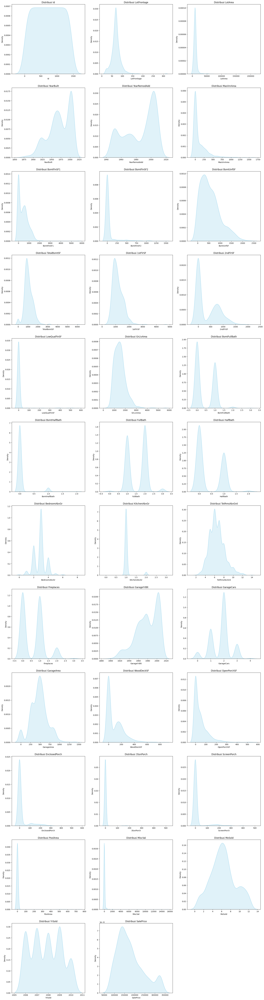

In [66]:
print("\nVisualisasi Distribusi Data dari Setiap Kolom:")
plot_distribution_plot_subplots(data_eda)

### **Memeriksa Distribusi Fitur**

In [67]:
for nama_kolom in data_eda.select_dtypes(include='number').columns:
    print(f"{nama_kolom}")
    
    # Hitung skewness
    skewness = skew(data_eda[nama_kolom])
    print(f"Skewness: {skewness}")


    p_value = norm.sf(abs(skewness))
    if p_value < 0.05:
        print(f"Skewness dari {nama_kolom} signifikan (p-value={p_value}), menunjukkan distribusi tidak normal.")
    else:
        print(f"Skewness dari {nama_kolom} tidak signifikan (p-value={p_value}), menunjukkan distribusi normal.")

    print("\n")

Id
Skewness: 0.0
Skewness dari Id tidak signifikan (p-value=0.5), menunjukkan distribusi normal.


LotFrontage
Skewness: 2.4066708091473084
Skewness dari LotFrontage signifikan (p-value=0.008049336885087863), menunjukkan distribusi tidak normal.


LotArea
Skewness: 12.195142125084478
Skewness dari LotArea signifikan (p-value=1.6496393522549916e-34), menunjukkan distribusi tidak normal.


YearBuilt
Skewness: -0.612830724202899
Skewness dari YearBuilt tidak signifikan (p-value=0.2699941366332642), menunjukkan distribusi normal.


YearRemodAdd
Skewness: -0.5030444967597948
Skewness dari YearRemodAdd tidak signifikan (p-value=0.3074664940394669), menunjukkan distribusi normal.


MasVnrArea
Skewness: 2.6748646898037354
Skewness dari MasVnrArea signifikan (p-value=0.0037379708344320263), menunjukkan distribusi tidak normal.


BsmtFinSF1
Skewness: 1.6837708962341815
Skewness dari BsmtFinSF1 signifikan (p-value=0.0461129769253594), menunjukkan distribusi tidak normal.


BsmtFinSF2
Skewness: 4.

# **Feature Engineering**

## **Load Dataset**

In [68]:
# Membaca dataset
data = df_otcW.copy()

## **Pembuatan Fitur Baru**

### **Agregasi**

In [69]:
# Fitur baru: TotalBuildingSF
data['TotalBuildingSF'] = data['1stFlrSF'] + data['2ndFlrSF'] + data['TotalBsmtSF']


Insight: 
* Fitur ini menunjukkan total luas bangunan yang terdiri dari luas lantai pertama, lantai kedua, dan luas basement.
* Semakin besar nilai TotalBuildingSF, semakin besar ukuran keseluruhan bangunan.

In [70]:
# Fitur baru: TotalBathrooms
data['TotalBathrooms'] = (data['FullBath'] + data['HalfBath']) + (data['BsmtFullBath'] + data['BsmtHalfBath'])

Insight: 
* Fitur ini menunjukkan jumlah total kamar mandi di atas dan di bawah grade.
* Semakin besar nilai TotalBathrooms, semakin banyak kamar mandi yang tersedia di properti tersebut.

In [71]:
# Fitur baru: TotalStreetFrontage
outdoor_features = ['LotFrontage','WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch']
data['TotalStreetFrontage'] = data[outdoor_features].sum(axis=1)

Insight: 
* Fitur ini menunjukkan total panjang garis depan properti, termasuk panjang garis depan dari garasi dan teras.
* Semakin besar nilai TotalStreetFrontage, semakin besar panjang garis depan properti.

In [72]:
# Fitur baru: MainFloorBathrooms
data['MainFloorBathrooms'] = data['FullBath'] + data['HalfBath']

Insight: 
* Fitur ini menunjukkan jumlah total kamar mandi di lantai pertama.
* Mengetahui jumlah kamar mandi di lantai pertama dapat memberikan gambaran tentang kenyamanan dan fungsionalitas rumah.

In [73]:
# Fitur baru: MainFloorRatio
data['MainFloorRatio'] = data['1stFlrSF'] / data['TotalBuildingSF']

Insight: 
* Fitur ini menunjukkan rasio antara luas lantai pertama dengan total luas bangunan.
* Rasio yang lebih tinggi menunjukkan proporsi yang lebih besar dari bangunan yang berada di lantai pertama.

In [74]:
# Fitur baru: LivingAreaPerRoom
data['LivingAreaPerRoom'] = data['GrLivArea'] / data['TotRmsAbvGrd']

Insight: 
* Fitur ini menunjukkan rata-rata luas area tinggal per ruangan di atas grade.
* Semakin besar nilai LivingAreaPerRoom, semakin besar ruang yang tersedia per ruangan.

In [75]:
# Fitur baru: GarageAreaPerCar
data['GarageAreaPerCar'] = data['GarageArea'] / data['GarageCars']
data['GarageAreaPerCar'] = data['GarageAreaPerCar'].fillna(0)

Insight
* Fitur ini menunjukkan rata-rata luas gudang per mobil.
* Semakin besar nilai GarageAreaPerCar, semakin banyak ruang yang tersedia untuk setiap mobil di gudang.

### **Transformasi**

In [76]:
# Fitur baru: PropertyAge
data['PropertyAge'] = data['YrSold'] - data['YearBuilt']

Insight
* Fitur ini menunjukkan usia properti pada saat penjualan.
* Semakin besar nilai PropertyAge, semakin tua properti tersebut.

In [77]:
# Fitur baru: GarageAge
data['GarageAge'] = data['YrSold'] - data['GarageYrBlt']

Insight
* Fitur ini menunjukkan usia garasi pada saat penjualan.
* Semakin besar nilai GarageAge, semakin tua garasi tersebut.

In [78]:
# Fitur baru: PorchType
porch_types = []
for index, row in data.iterrows():
    if row['OpenPorchSF'] > 0 or row['EnclosedPorch'] > 0:
        porch_types.append('Covered')
    elif row['ScreenPorch'] > 0:
        porch_types.append('Screened')
    else:
        porch_types.append('Without')

data['PorchType'] = porch_types
data['PorchType'] = data['PorchType'].astype('category')

Insight: 
* Fitur ini menunjukkan jenis teras yang dimiliki oleh properti, apakah tertutup (Covered), terlindungi(Screened), atau tanpa teras (Without).
* Mengetahui jenis teras dapat memberikan gambaran tentang ruang outdoor yang tersedia dan tingkat kenyamanan untuk beraktivitas di luar ruangan.

### **Ekstraksi**

In [79]:
# Fitur baru: Remodeled
data['Remodeled'] = (data['YearBuilt'] != data['YearRemodAdd']).astype(int)

Insight:
* Fitur ini menunjukkan apakah rumah telah direnovasi sebelum penjualan atau tidak.
* Mengetahui apakah rumah telah direnovasi dapat memberikan informasi tambahan tentang kondisi dan nilai properti.

In [80]:
# Fitur baru: BuildingRating
data['BuildingRating'] = np.ceil((data['OverallQual'].astype(int) + data['OverallCond'].astype(int)) / 2).astype(int)


Insight: 
* Fitur ini menunjukkan penilaian keseluruhan rumah, dihitung sebagai nilai rata-rata dari OverallQual dan OverallCond, yang dibulatkan ke atas.
* Semakin tinggi nilai BuildingRating, semakin tinggi penilaian bangunan rumah.

### **Tampilkan**

In [81]:
data.iloc[:, -15:]

,SaleType,SaleCondition,SalePrice,TotalBuildingSF,TotalBathrooms,TotalStreetFrontage,MainFloorBathrooms,MainFloorRatio,LivingAreaPerRoom,GarageAreaPerCar,PropertyAge,GarageAge,PorchType,Remodeled,BuildingRating
0,WD,Normal,208500,2566,4,126.0,3,0.333593,213.750000,274.000000,5,5.0,Covered,0,6
1,WD,Normal,181500,2524,3,378.0,2,0.500000,210.333333,230.000000,31,31.0,Without,0,7
2,WD,Normal,223500,2706,4,110.0,3,0.339985,297.666667,304.000000,7,7.0,Covered,1,6
3,WD,Abnorml,140000,2473,2,367.0,1,0.388597,245.285714,214.000000,91,8.0,Covered,1,6
4,WD,Normal,250000,3343,4,360.0,3,0.342507,244.222222,278.666667,8,8.0,Covered,0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,WD,Normal,175000,2600,3,102.0,3,0.366538,235.285714,230.000000,8,8.0,Covered,1,6
1456,WD,Normal,210000,3615,3,434.0,2,0.573444,296.142857,250.000000,32,32.0,Without,1,6
1457,WD,Normal,266500,3492,2,126.0,2,0.340206,260.000000,252.000000,69,69.0,Covered,1,8
1458,WD,Normal,142125,2156,2,546.0,1,0.500000,215.600000,240.000000,60,60.0,Covered,1,6


# **Machine Learning Regression Model**

Seperti yang telah dijelaskan pada Data Preparation, dataset ini akan digunakan untuk membangun model `regresi`. Oleh karena itu, kita akan membandingkan beberapa algoritma regresi untuk memprediksi harga penjualan rumah dengan target column `SalePrice`.

## **Library**

In [82]:
#pip install xgboost

In [83]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge, Lasso, ElasticNet
import xgboost as xgb
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

## **Fixing Data Encoding**

In [84]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 93 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   Id                   1460 non-null   int64   
 1   MSSubClass           1460 non-null   category
 2   MSZoning             1460 non-null   category
 3   LotFrontage          1460 non-null   float64 
 4   LotArea              1460 non-null   int64   
 5   Street               1460 non-null   category
 6   Alley                1460 non-null   category
 7   LotShape             1460 non-null   category
 8   LandContour          1460 non-null   category
 9   Utilities            1460 non-null   category
 10  LotConfig            1460 non-null   category
 11  LandSlope            1460 non-null   category
 12  Neighborhood         1460 non-null   category
 13  Condition1           1460 non-null   category
 14  Condition2           1460 non-null   category
 15  BldgType             

In [85]:
data_encoded = data.copy()

### **Convert to Default Type**

In [86]:
data_encoded[['MSSubClass', 'OverallQual', 'OverallCond']] = data[['MSSubClass', 'OverallQual', 'OverallCond']].astype(int)

### **Ordinal Encoding**

In [87]:
ordinal_encoders = {
    "ExterQual": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1},
    "ExterCond": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1},
    "BsmtQual": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "Without": 0},
    "BsmtCond": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "Without": 0},
    "BsmtExposure": {"Gd": 4, "Av": 3, "Mn": 2, "No": 1, "Without": 0},
    "BsmtFinType1": {"GLQ": 6, "ALQ": 5, "BLQ": 4, "Rec": 3, "LwQ": 2, "Unf": 1, "Without": 0},
    "BsmtFinType2": {"GLQ": 6, "ALQ": 5, "BLQ": 4, "Rec": 3, "LwQ": 2, "Unf": 1, "Without": 0},
    "HeatingQC": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1},
    "KitchenQual": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1},
    "Functional": {"Typ": 8, "Min1": 7, "Min2": 6, "Mod": 5, "Maj1": 4, "Maj2": 3, "Sev": 2, "Sal": 1},
    "FireplaceQu": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "Without": 0},
    "GarageQual": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "Without": 0},
    "GarageCond": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "Without": 0},
    "GarageFinish": {"Fin": 3, "RFn": 2, "Unf": 1, "Without": 0},
    "PoolQC": {"Ex": 4, "Gd": 3, "TA": 2, "Fa": 1, "Without": 0},
    "Fence": {"GdPrv": 4, "MnPrv": 3, "GdWo": 2, "MnWw": 1, "Without": 0},
}

In [88]:
def apply_ordinal_encoding(data, ordinal_encoders):
    for column, mapping in ordinal_encoders.items():
        if column in data.columns:
            data[column] = data[column].map(mapping)
    return data

df_encoded = apply_ordinal_encoding(data_encoded, ordinal_encoders)

# # List nama kolom yang akan ditampilkan
# kolom_yang_ingin_ditampilkan = list(ordinal_encoders.keys())

# # Tampilkan DataFrame hanya dengan kolom-kolom yang dipilih
# df_subset = data_encoded[kolom_yang_ingin_ditampilkan]
# df_subset

### **Label Encoding**

In [89]:
data_encoded = auto_encoder.fit_transform(data_encoded.copy())

## **Fitur Selecting**

### **Correlation Matrix**

In [90]:
sales_correlation = data_encoded.corr()

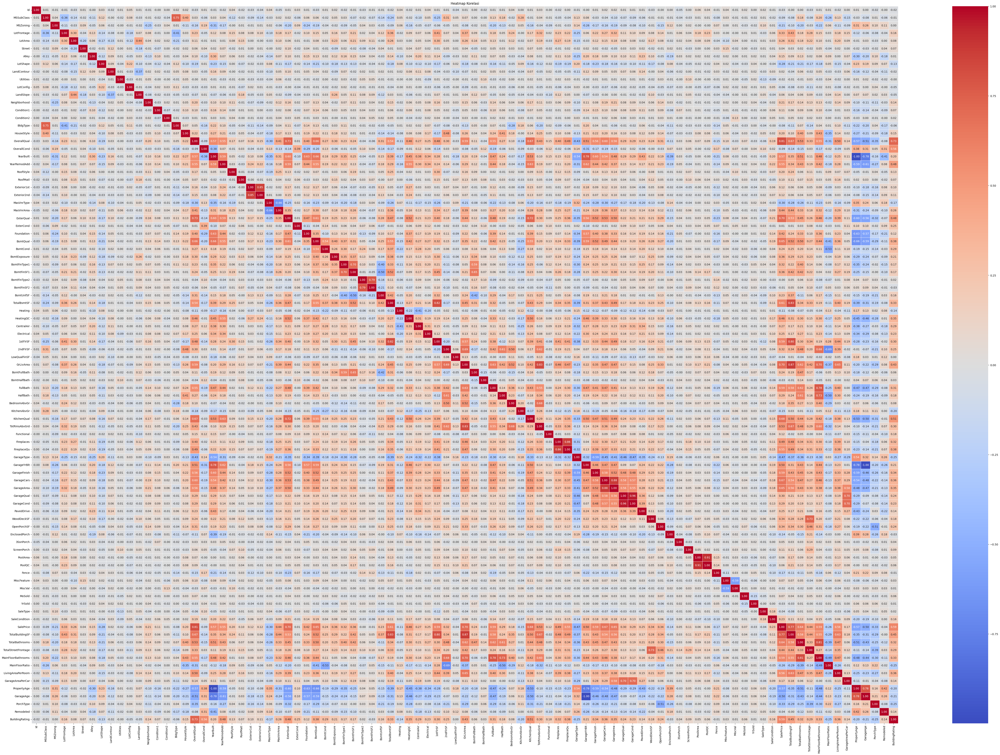

In [91]:
plt.figure(figsize=(72, 48))
sns.heatmap(sales_correlation, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Heatmap Korelasi')
plt.show()

### **Feature Importance**

In [127]:
correlation_with_sale_price_filtered = sales_correlation[
    ((sales_correlation['SalePrice'] > 0.3) & (sales_correlation['SalePrice'] < 1))
]

relevant_columns = correlation_with_sale_price_filtered.index
correlation_values = correlation_with_sale_price_filtered['SalePrice']

In [128]:
print("Korelasi Positif:")
for column, correlation_value in zip(relevant_columns, correlation_values):
    if correlation_value > 0.3:
        print(f"Fitur: {column}, Correlation with SalePrice: {correlation_value}")

Korelasi Positif:
Fitur: LotFrontage, Correlation with SalePrice: 0.33348658503596434
Fitur: OverallQual, Correlation with SalePrice: 0.812369458889186
Fitur: YearBuilt, Correlation with SalePrice: 0.5700712627872102
Fitur: YearRemodAdd, Correlation with SalePrice: 0.5520260204272455
Fitur: MasVnrArea, Correlation with SalePrice: 0.4357091239113855
Fitur: ExterQual, Correlation with SalePrice: 0.7003659630588421
Fitur: Foundation, Correlation with SalePrice: 0.4156237364602366
Fitur: BsmtQual, Correlation with SalePrice: 0.6496504228191562
Fitur: BsmtExposure, Correlation with SalePrice: 0.364509986431366
Fitur: BsmtFinType1, Correlation with SalePrice: 0.31871303519145205
Fitur: BsmtFinSF1, Correlation with SalePrice: 0.36427311292443254
Fitur: TotalBsmtSF, Correlation with SalePrice: 0.6057335739316942
Fitur: HeatingQC, Correlation with SalePrice: 0.45890312546577916
Fitur: 1stFlrSF, Correlation with SalePrice: 0.5940541376182421
Fitur: 2ndFlrSF, Correlation with SalePrice: 0.3183616

In [129]:
print("\nKorelasi Negatif:")
for column, correlation_value in zip(relevant_columns, correlation_values):
    if correlation_value < -0.3:
        print(f"Fitur: {column}, Correlation with SalePrice: {correlation_value}")


Korelasi Negatif:


In [130]:
featuresX = relevant_columns.to_list()

## **Splitting Data**

### **Split Data to X and y**

In [131]:
df_encoded = pd.DataFrame(data_encoded)

y = df_encoded[target_columns]
X = df_encoded[featuresX]

In [132]:
y

,SalePrice
0,208500
1,181500
2,223500
3,140000
4,250000
...,...
1455,175000
1456,210000
1457,266500
1458,142125


In [133]:
X

,LotFrontage,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,...,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,TotalBuildingSF,TotalBathrooms,TotalStreetFrontage,MainFloorBathrooms,LivingAreaPerRoom,BuildingRating
0,65.0,7,2003,2003,196.0,2,2,3,1,6,...,2,548,0,61,2566,4,126.0,3,213.750000,6
1,80.0,6,1976,1976,0.0,1,1,3,4,5,...,2,460,298,0,2524,3,378.0,2,210.333333,7
2,68.0,7,2001,2002,162.0,2,2,3,2,6,...,2,608,0,42,2706,4,110.0,3,297.666667,6
3,60.0,7,1915,1970,0.0,1,0,2,1,5,...,3,642,0,35,2473,2,367.0,1,245.285714,6
4,84.0,8,2000,2000,350.0,2,2,3,3,6,...,3,836,192,84,3343,4,360.0,3,244.222222,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,62.0,6,1999,2000,0.0,1,2,3,1,1,...,2,460,0,40,2600,3,102.0,3,235.285714,6
1456,85.0,6,1978,1988,119.0,1,1,3,1,5,...,2,500,349,0,3615,3,434.0,2,296.142857,6
1457,66.0,7,1941,2006,0.0,3,4,2,1,6,...,1,252,0,60,3492,2,126.0,2,260.000000,8
1458,68.0,5,1950,1996,0.0,1,1,2,2,6,...,1,240,366,0,2156,2,546.0,1,215.600000,6


### **Split Data to Train and Test 80:20**

In [134]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [135]:
X_train

,LotFrontage,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,...,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,TotalBuildingSF,TotalBathrooms,TotalStreetFrontage,MainFloorBathrooms,LivingAreaPerRoom,BuildingRating
254,70.0,5,1957,1957,0.0,1,1,2,1,3,...,1,294,250,0,2628,2,320.0,1,262.800000,6
1066,59.0,6,1993,1994,0.0,2,2,3,1,1,...,2,380,0,40,2370,3,99.0,3,224.428571,7
638,67.0,5,1910,1950,0.0,1,1,1,1,1,...,0,0,328,0,1592,1,559.0,1,199.000000,6
799,60.0,5,1937,1950,252.0,1,0,3,1,5,...,1,240,0,0,2499,3,324.0,2,252.571429,6
380,50.0,5,1924,1950,0.0,1,0,2,1,2,...,1,308,0,0,2717,2,292.0,2,281.833333,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,78.0,6,2006,2006,0.0,2,2,3,1,6,...,2,440,0,22,2628,2,100.0,2,219.000000,6
1130,65.0,4,1928,1950,0.0,1,0,2,1,4,...,2,576,431,44,3103,3,540.0,2,283.000000,4
1294,60.0,5,1955,1990,0.0,1,1,2,1,3,...,2,572,0,0,1728,2,60.0,1,172.800000,6
860,55.0,7,1918,1998,0.0,2,0,2,1,1,...,1,216,0,240,2338,2,295.0,2,203.714286,8


## **Feature Scaling**

In [136]:
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.fit_transform(X_test)

In [137]:
np.set_printoptions(suppress=True)
print(X_train[:10])

[[-0.00419319 -0.82044456 -0.45546896 -1.34606303 -0.5978887  -0.68742066
  -0.55389881 -0.66026715 -0.58772739 -0.25578675  1.03726861  0.57261219
  -1.16829211  0.37423523 -0.80192292 -0.40709315 -1.05556573 -0.76707624
  -0.96456591 -0.95859215 -1.0162412  -0.90440277  0.3096338  -1.05654384
  -0.86383727  1.18840233 -0.71435182  0.05423341 -0.48377079  0.38224206
  -1.21792095  0.70307946 -0.10752185]
 [-0.49395768 -0.08893368  0.71860895  0.43921379 -0.5978887   1.05424384
   0.81967616  0.62078274 -0.58772739 -1.20876576 -0.97199573 -0.59654659
  -0.1321758  -0.95820221  0.9550877   0.08317013  0.7736639  -0.76707624
   0.27075534  0.59214972  0.63922564  0.59354215  0.3096338   0.29509165
  -0.45626397 -0.74015748 -0.13801492 -0.26003524  0.61127627 -0.95184005
   1.32231417 -0.15347652  1.02387925]
 [-0.13776532 -0.82044456 -1.98829291 -1.6838181  -0.5978887  -0.68742066
  -0.55389881 -1.94131704 -0.58772739 -1.20876576 -0.97199573 -0.60335723
  -0.1321758  -0.96596398 -0.80192

## **Model Building**

### **Model Evaluation Metrics**

In [138]:
def evaluate_model(y_test, y_pred):
    r2score = r2_score(y_test, y_pred)

    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))

    print('R2 Score : ', r2score)
    print('Mean Squared Error : ', mse)
    print('Mean Absolute Error : ', mae)
    print('Root Mean Squared Error : ', rmse)

### **Original Model**

#### **Linear Regression**

In [139]:
# Inisialisasi model Linear Regression
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)
y_pred_linear = linear_model.predict(X_test)

In [140]:
evaluate_model(y_test, y_pred_linear)

R2 Score :  0.8705962785269794
Mean Squared Error :  574869487.2054448
Mean Absolute Error :  18801.06340941206
Root Mean Squared Error :  23976.43608223384


#### **Polynomial Regression**

In [141]:
# Inisialisasi model Polynomial Regression
degree = 2  # Derajat fitur polinomial
poly_model = make_pipeline(PolynomialFeatures(degree), LinearRegression())
poly_model.fit(X_train, y_train)
y_pred_poly = poly_model.predict(X_test)

In [142]:
evaluate_model(y_test, y_pred_poly)

R2 Score :  -1.7677174756316269e+19
Mean Squared Error :  7.852995471635845e+28
Mean Absolute Error :  157524537648813.56
Root Mean Squared Error :  280231965907457.53


#### **Random Forest Regressor**

In [143]:
# Inisialisasi model Random Forest Regressor
rf_model = RandomForestRegressor(max_depth=2, random_state=0)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)

In [144]:
evaluate_model(y_test, y_pred_rf)

R2 Score :  0.8261961778918937
Mean Squared Error :  772114688.4517123
Mean Absolute Error :  22236.725941181023
Root Mean Squared Error :  27786.951766102597


#### **Ridge Regression**

In [145]:
# Inisialisasi model Ridge Regression
ridge_model = Ridge(alpha=1.0)  # alpha adalah kekuatan regularisasi
ridge_model.fit(X_train, y_train)
y_pred_ridge = ridge_model.predict(X_test)

In [146]:
evaluate_model(y_test, y_pred_ridge)

R2 Score :  0.8706074294197657
Mean Squared Error :  574819949.9282712
Mean Absolute Error :  18783.218132000588
Root Mean Squared Error :  23975.40301910004


#### **Lasso Regression**

In [147]:
# Inisialisasi model Lasso Regression
lasso_model = Lasso(alpha=1.0)  # alpha adalah kekuatan regularisasi
lasso_model.fit(X_train, y_train)
y_pred_lasso = lasso_model.predict(X_test)

In [148]:
evaluate_model(y_test, y_pred_lasso)

R2 Score :  0.8708029368522952
Mean Squared Error :  573951418.0483242
Mean Absolute Error :  18797.383376339385
Root Mean Squared Error :  23957.283194225598


#### **Elastic Net**

In [149]:
# Inisialisasi model ElasticNet Regression
elastic_model = ElasticNet(alpha=1.0, l1_ratio=0.5)  # alpha adalah kekuatan regularisasi, l1_ratio adalah parameter pencampuran ElasticNet
elastic_model.fit(X_train, y_train)

ElasticNet()

In [150]:
evaluate_model(y_test, y_pred_lasso)

R2 Score :  0.8708029368522952
Mean Squared Error :  573951418.0483242
Mean Absolute Error :  18797.383376339385
Root Mean Squared Error :  23957.283194225598


#### **Extreme Gradient Boosting Regressor**

In [151]:
# Inisialisasi model XGBoost
xgb_model = xgb.XGBRegressor()
xgb_model.fit(X_train, y_train)
y_pred_xgb = xgb_model.predict(X_test)

In [152]:
evaluate_model(y_test, y_pred_xgb)

R2 Score :  0.862253235349157
Mean Squared Error :  611933034.5190172
Mean Absolute Error :  17726.410932148974
Root Mean Squared Error :  24737.280257114307


#### **Support Vector Regressor**

In [153]:
# Inisialisasi model Support Vector Regression
svr_model = SVR(kernel='rbf')  # 'rbf' adalah kernel fungsi basis radial
svr_model.fit(X_train, y_train)
y_pred_svr = svr_model.predict(X_test)

In [154]:
evaluate_model(y_test, y_pred_svr)

R2 Score :  -0.017772243035156343
Mean Squared Error :  4521401709.204635
Mean Absolute Error :  52711.39478712456
Root Mean Squared Error :  67241.36903130866


#### **Decision Tree Regressor**

In [155]:
# Inisialisasi model Decision Tree Regression
dt_model = DecisionTreeRegressor()
dt_model.fit(X_train, y_train)
y_pred_dt = dt_model.predict(X_test)

In [156]:
evaluate_model(y_test, y_pred_dt)

R2 Score :  0.7616457978248472
Mean Squared Error :  1058876486.8424658
Mean Absolute Error :  23030.31506849315
Root Mean Squared Error :  32540.38240160164


#### **Neural Network Regression**

In [157]:
# # Inisialisasi model Neural Network menggunakan TensorFlow dan Keras
# nn_model = Sequential([
#     Dense(64, activation='relu', input_shape=(input_dim,)),  # input_dim adalah dimensi fitur
#     Dense(64, activation='relu'),
#     Dense(1)
# ])

# # Kompilasi model Neural Network
# nn_model.compile(optimizer='adam', loss='mean_squared_error')

### **Cross Validation**

### **Learning Curve**